In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
from matplotlib import pyplot as plt
from pylab import rcParams
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

In [2]:
train = pd.read_csv('train.csv',index_col='id')
hol_events = pd.read_csv('holidays_events.csv')
oil = pd.read_csv('oil.csv')
stores = pd.read_csv('stores.csv',index_col='store_nbr')
#stores.index = stores.index.astype(np.uint8)
transactions = pd.read_csv('transactions.csv')

In [3]:
train['date'] = pd.to_datetime(train['date'])
train['date'] = train['date'].dt.to_period('D')
hol_events['date'] = pd.to_datetime(hol_events['date'])
hol_events['date'] = hol_events['date'].dt.to_period('D')
oil['date'] = pd.to_datetime(oil['date'])
oil['date'] = oil['date'].dt.to_period('D')
transactions['date'] = pd.to_datetime(transactions['date'])
transactions['date'] = transactions['date'].dt.to_period('D')
train.sort_values(by=['date','store_nbr','family'],ascending=True,ignore_index=True,inplace=True)

In [4]:
label_encoder = LabelEncoder()

In [5]:
train['onpromotion'] = train['onpromotion'].astype(np.uint16)
train['family'] = label_encoder.fit_transform(train['family'])
family_dict = {num:name for num,name in zip(range(len(label_encoder.classes_)),label_encoder.classes_)}
train

,date,store_nbr,family,sales,onpromotion
0,2013-01-01,1,0,0.000,0
1,2013-01-01,1,1,0.000,0
2,2013-01-01,1,2,0.000,0
3,2013-01-01,1,3,0.000,0
4,2013-01-01,1,4,0.000,0
...,...,...,...,...,...
3000883,2017-08-15,54,28,59.619,0
3000884,2017-08-15,54,29,94.000,0
3000885,2017-08-15,54,30,915.371,76
3000886,2017-08-15,54,31,0.000,0


In [6]:
def make_label_dict(labels):
    return {num:name for num,name in zip(range(len(labels)),labels)}

In [7]:
hol_events['type'] = label_encoder.fit_transform(hol_events['type'])
type_dict = make_label_dict(label_encoder.classes_)
hol_events['locale'] = label_encoder.fit_transform(hol_events['locale'])
locale_dict = make_label_dict(label_encoder.classes_)
hol_events['locale_name'] = label_encoder.fit_transform(hol_events['locale_name'])
locale_name_dict = make_label_dict(label_encoder.classes_)
hol_events['description'] = label_encoder.fit_transform(hol_events['description'])
description_dict = make_label_dict(label_encoder.classes_)

In [8]:
hol_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,3,0,15,25,False
1,2012-04-01,3,2,2,54,False
2,2012-04-12,3,0,3,18,False
3,2012-04-14,3,0,12,6,False
4,2012-04-21,3,0,19,8,False
...,...,...,...,...,...,...
345,2017-12-22,0,1,4,48,False
346,2017-12-23,0,1,4,47,False
347,2017-12-24,0,1,4,46,False
348,2017-12-25,3,1,4,44,False


In [9]:
#np.random.seed(3)
oil['interp'] = oil['dcoilwtico'].interpolate(method='linear')
#oil.loc[0,'interp'] = oil.loc[1,'interp'] + np.random.randn(1)
oil

,date,dcoilwtico,interp
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,93.14
2,2013-01-03,92.97,92.97
3,2013-01-04,93.12,93.12
4,2013-01-07,93.20,93.20
...,...,...,...
1213,2017-08-25,47.65,47.65
1214,2017-08-28,46.40,46.40
1215,2017-08-29,46.46,46.46
1216,2017-08-30,45.96,45.96


In [10]:
stores['city'] = label_encoder.fit_transform(stores['city'])
city_dict = make_label_dict(label_encoder.classes_)
stores['state'] = label_encoder.fit_transform(stores['state'])
state_dict = make_label_dict(label_encoder.classes_)
stores['type'] = label_encoder.fit_transform(stores['type'])
stores_type_dict = make_label_dict(label_encoder.classes_)

In [11]:
train = pd.merge(left=train, right=oil[['date','interp']], how='left', on='date')
train = pd.merge(left=train, right=stores, how='left', on='store_nbr')
#train = pd.merge(left=train, right=hol_events, how='left', on='store_nbr')
train = pd.merge(left=train, right=transactions, how='left', on=['date','store_nbr'])

In [12]:
train['day'] = train['date'].dt.day.astype(np.uint8)
train['weekday'] = train['date'].dt.weekday.astype(np.uint8)
train['week'] = train['date'].dt.week.astype(np.uint8)
train['month'] = train['date'].dt.month.astype(np.uint8)
train['year'] = train['date'].dt.year.astype(np.uint16)

In [13]:
train

,date,store_nbr,family,sales,onpromotion,interp,city,state,type,cluster,transactions,day,weekday,week,month,year
0,2013-01-01,1,0,0.000,0,NaN,18,12,3,13,NaN,1,1,1,1,2013
1,2013-01-01,1,1,0.000,0,NaN,18,12,3,13,NaN,1,1,1,1,2013
2,2013-01-01,1,2,0.000,0,NaN,18,12,3,13,NaN,1,1,1,1,2013
3,2013-01-01,1,3,0.000,0,NaN,18,12,3,13,NaN,1,1,1,1,2013
4,2013-01-01,1,4,0.000,0,NaN,18,12,3,13,NaN,1,1,1,1,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,54,28,59.619,0,47.57,5,10,2,3,802.0,15,1,33,8,2017
3000884,2017-08-15,54,29,94.000,0,47.57,5,10,2,3,802.0,15,1,33,8,2017
3000885,2017-08-15,54,30,915.371,76,47.57,5,10,2,3,802.0,15,1,33,8,2017
3000886,2017-08-15,54,31,0.000,0,47.57,5,10,2,3,802.0,15,1,33,8,2017


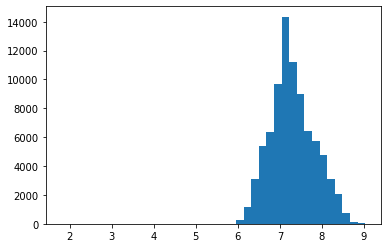

In [14]:
plt.hist(np.log(transactions['transactions']+1),bins=40)
plt.show()

In [15]:
train['transactions'].fillna(value=0,inplace=True)

In [16]:
train[['transactions','sales']].corr()

,transactions,sales
transactions,1.000000,0.233081
sales,0.233081,1.000000


In [17]:
grouped = train.groupby(['store_nbr','date'])['sales','transactions']
grouped.mean()

/tmp/ipykernel_58161/3212898563.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  grouped = train.groupby(['store_nbr','date'])['sales','transactions']


sales  transactions
store_nbr date                                
1         2013-01-01    0.000000           0.0
          2013-01-02  224.762061        2111.0
          2013-01-03  177.977091        1833.0
          2013-01-04  179.390273        1863.0
          2013-01-05  191.478334        1509.0
...                          ...           ...
54        2017-08-11  257.994970         768.0
          2017-08-12  276.959939         903.0
          2017-08-13  431.722060        1054.0
          2017-08-14  360.090727         818.0
          2017-08-15  383.844182         802.0

[90936 rows x 2 columns]

In [18]:
print("Pearson")
grouped.sum().corr()

Pearson


,sales,transactions
sales,1.000000,0.853988
transactions,0.853988,1.000000


In [19]:
print("Spearman")
grouped.sum().corr('spearman')

Spearman


,sales,transactions
sales,1.000000,0.854564
transactions,0.854564,1.000000


In [20]:
print("Pearson")
grouped.mean().corr()

Pearson


,sales,transactions
sales,1.000000,0.853988
transactions,0.853988,1.000000


In [21]:
print("Spearman")
grouped.mean().corr('spearman')

Spearman


,sales,transactions
sales,1.000000,0.854564
transactions,0.854564,1.000000


# Correlation
## r for Pearson
## s for Spearman

In [22]:
for q in [.05, .25, .5, .75, .85, .95, .98, .99]:
    print(f"q={q} : r={grouped.quantile(q).corr().iloc[0,1]} | s={grouped.quantile(q).corr('spearman').iloc[0,1]}")

q=0.05 : r=0.3187086418901721 | s=0.27008941857343977
q=0.25 : r=0.5768879784854559 | s=0.43279142349102606
q=0.5 : r=0.6721190568156539 | s=0.6453658887736811
q=0.75 : r=0.8673053423183987 | s=0.8430981284734204
q=0.85 : r=0.864830016361241 | s=0.8536728294558761
q=0.95 : r=0.7678649229435275 | s=0.7877158314888784
q=0.98 : r=0.8359607490010084 | s=0.8374464704814188
q=0.99 : r=0.8529796081435874 | s=0.8644221935210898


# Looks like log-norm and log-laplace distributions

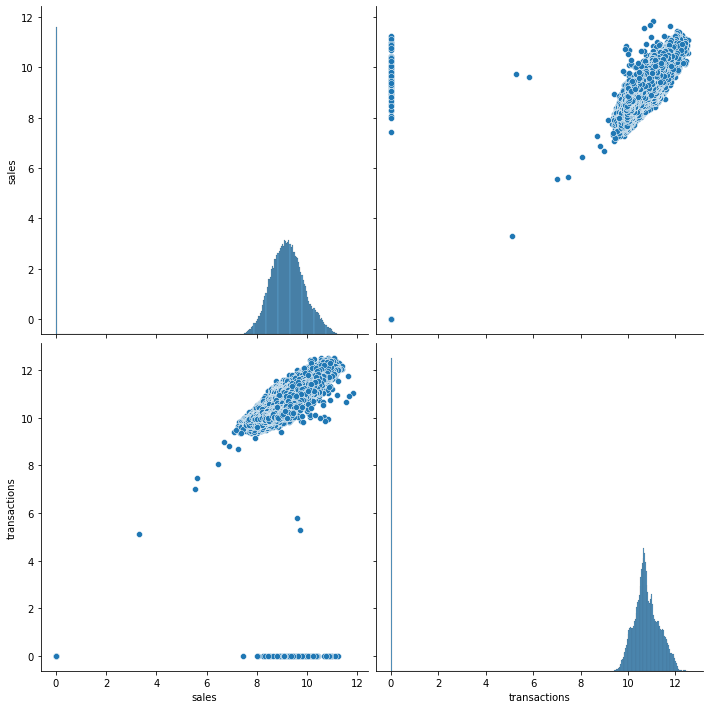

In [23]:
rcParams['figure.figsize'] = 13,7
sns.pairplot(np.log(grouped.sum()+1),height=5)

In [24]:
from scipy.stats import ks_1samp, laplace, norm

In [25]:
def laplace_args(df):
    mu = df.median()
    return (np.mean(np.abs(df-mu)), mu)

temp = np.log(grouped.sum()['transactions']+1)
ks_1samp(temp,laplace.cdf, args=laplace_args(temp))

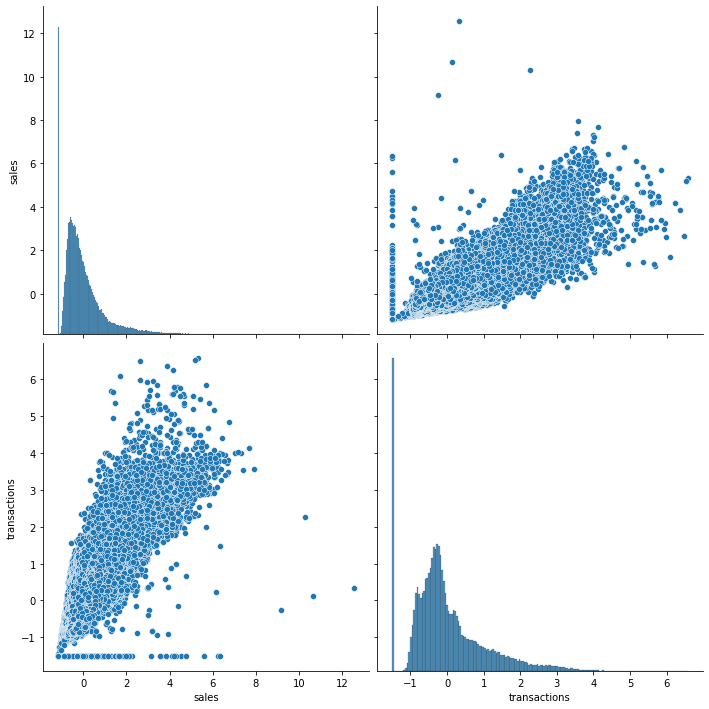

In [26]:
rcParams['figure.figsize'] = 13,7
s_scale = StandardScaler()
temp = pd.DataFrame(s_scale.fit_transform(grouped.sum()),columns=['sales','transactions'])
sns.pairplot(temp, height=5)
plt.show()

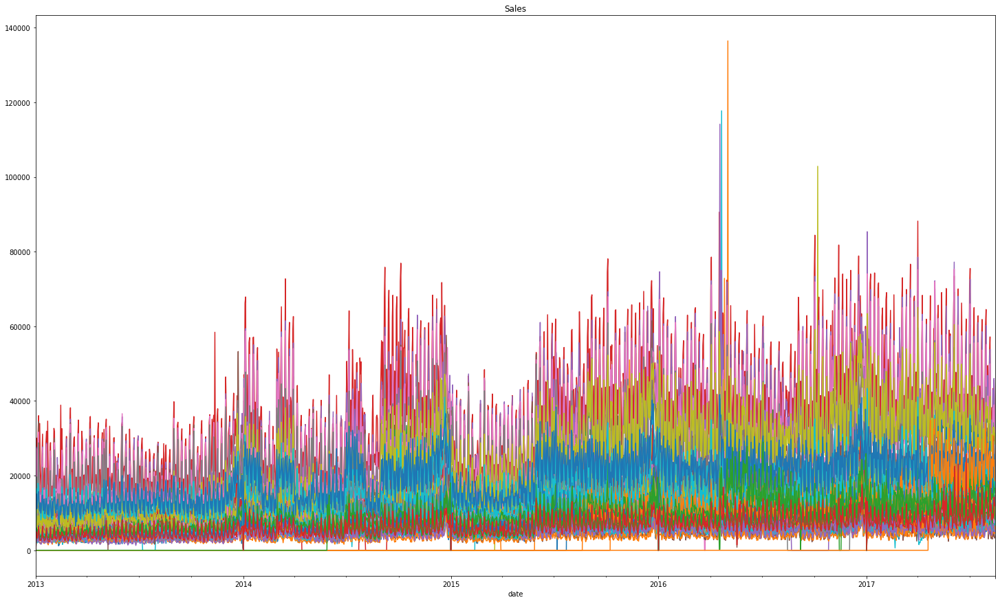

In [27]:
rcParams['figure.figsize'] = 25,15
temp = grouped.sum()
for store_num in stores.index:
    temp.loc[store_num,'sales'].plot(label=store_num)
plt.title('Sales')
plt.show()

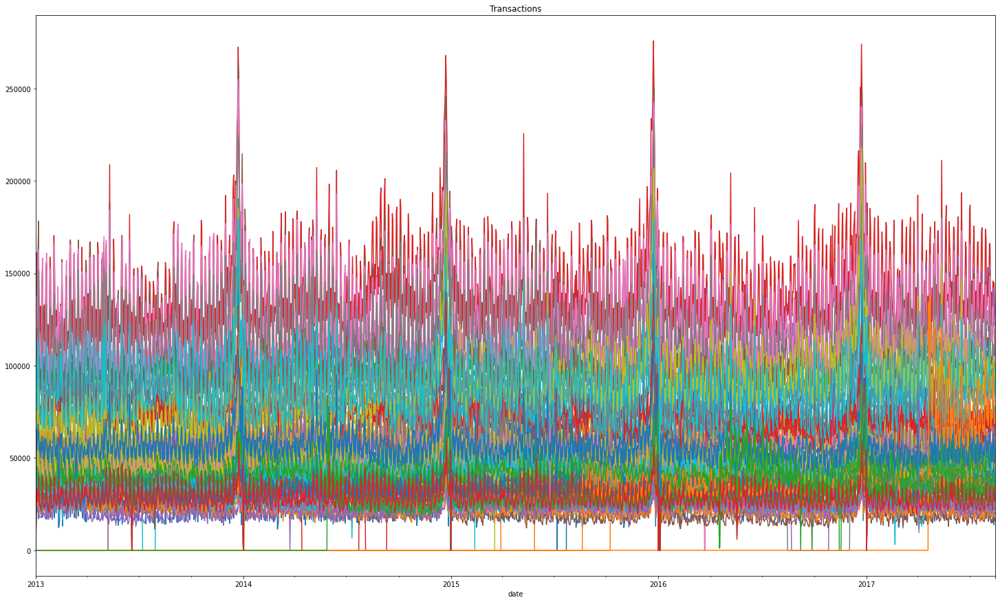

In [28]:
rcParams['figure.figsize'] = 25,15
temp = grouped.sum()
for store_num in stores.index:
    temp.loc[store_num,'transactions'].plot(label=store_num)
plt.title('Transactions')
plt.show()

In [29]:
transactions['year'] = transactions['date'].dt.year
transactions['month'] = transactions['date'].dt.month.astype(np.uint8)

In [30]:
transactions.head()

,date,store_nbr,transactions,year,month
0,2013-01-01,25,770,2013,1
1,2013-01-02,1,2111,2013,1
2,2013-01-02,2,2358,2013,1
3,2013-01-02,3,3487,2013,1
4,2013-01-02,4,1922,2013,1


In [31]:
px.box(transactions, x='year', y='transactions' , color = 'month', title = 'Transactions')

In [32]:
px.box(transactions, x='year', y='transactions' , color = 'month', title = 'Transactions',log_y=True)

In [33]:
transactions

,date,store_nbr,transactions,year,month
0,2013-01-01,25,770,2013,1
1,2013-01-02,1,2111,2013,1
2,2013-01-02,2,2358,2013,1
3,2013-01-02,3,3487,2013,1
4,2013-01-02,4,1922,2013,1
...,...,...,...,...,...
83483,2017-08-15,50,2804,2017,8
83484,2017-08-15,51,1573,2017,8
83485,2017-08-15,52,2255,2017,8
83486,2017-08-15,53,932,2017,8


In [36]:
temp = transactions.groupby(['year','month'])['transactions'].mean()
temp

year  month
2013  1        1657.898624
      2        1684.483696
      3        1724.181627
      4        1699.206522
      5        1702.874396
      6        1701.426743
      7        1675.012552
      8        1689.182567
      9        1688.270922
      10       1653.013040
      11       1680.756028
      12       2101.323404
2014  1        1696.334515
      2        1731.129939
      3        1748.232830
      4        1762.861450
      5        1751.757873
      6        1701.520567
      7        1667.126962
      8        1738.063014
      9        1712.679021
      10       1682.331989
      11       1701.595833
      12       2117.418750
2015  1        1727.313671
      2        1724.988235
      3        1717.135383
      4        1723.370748
      5        1756.840342
      6        1687.268667
      7        1672.950546
      8        1680.312186
      9        1631.571795
      10       1596.626300
      11       1590.058491
      12       1981.061635
2016  1        1

In [45]:
#sns.lineplot(x=temp.index, y=temp.values)

temp = transactions.set_index('date').resample('M').transactions.mean().reset_index()
temp['year'] = temp['date'].dt.year
px.line(temp, x='date', y='transactions', color='year',title='Monthly Average Transactions')

In [ ]:
plt.plot(temp['date'],temp['transactions'])

In [ ]:
oil['day'] = oil['date'].dt.day.astype(np.uint8)
oil['weekday'] = oil['date'].dt.weekday.astype(np.uint8)
oil['week'] = oil['date'].dt.week.astype(np.uint8)
oil['month'] = oil['date'].dt.month.astype(np.uint8)
oil['year'] = oil['date'].dt.year.astype(np.uint16)

In [ ]:
rcParams['figure.figsize'] = 20, 7
oil.index = oil['date']
_ = plot_acf(oil['interp'].dropna(), lags=60), plot_pacf(oil['interp'].dropna(), lags=60)

In [ ]:
rcParams['figure.figsize'] = 13,10
plt.scatter(oil['interp'],oil['interp'].shift(1))

col_dict = {name:num for num, name in zip(range(len(train.columns[1:])),train.columns[1:])}
col_dict

In [ ]:
rcParams['figure.figsize'] = 13,10
sns.scatterplot(train['sales'],train['onpromotion'])

In [ ]:
data = train.drop(index=train[(train['onpromotion']>350) | (train['sales']>40000)].index)

In [ ]:
rcParams['figure.figsize'] = 13,10
rscaler = RobustScaler()
sscaler = StandardScaler()
#normalizer = Normalizer()
temp = rscaler.fit_transform(data[['sales','onpromotion']],'l1')
#sns.scatterplot(temp[:,0],temp[:,1])
sns.scatterplot(data['sales'],data['onpromotion'])

In [ ]:
train[(train['onpromotion']>350) | (train['sales']>40000)].describe(
    percentiles=[.05, .25, .5, .75, .85, .95, .98],
)

In [ ]:
train[(train['sales']>40000)].describe(
    percentiles=[.05, .25, .5, .75, .85, .95, .98],
)

In [ ]:
train[(train['onpromotion']>350)].describe(
    percentiles=[.05, .25, .5, .75, .85, .95, .98],
)

In [ ]:
family_dict[12]

## City frequencies

In [ ]:
_ = train[(train['onpromotion']>350) | (train['sales']>40000)]['city'].value_counts()
sns.barplot(_.index, _)

In [ ]:
print(city_dict[5],city_dict[14], city_dict[15], city_dict[18],sep='\n')

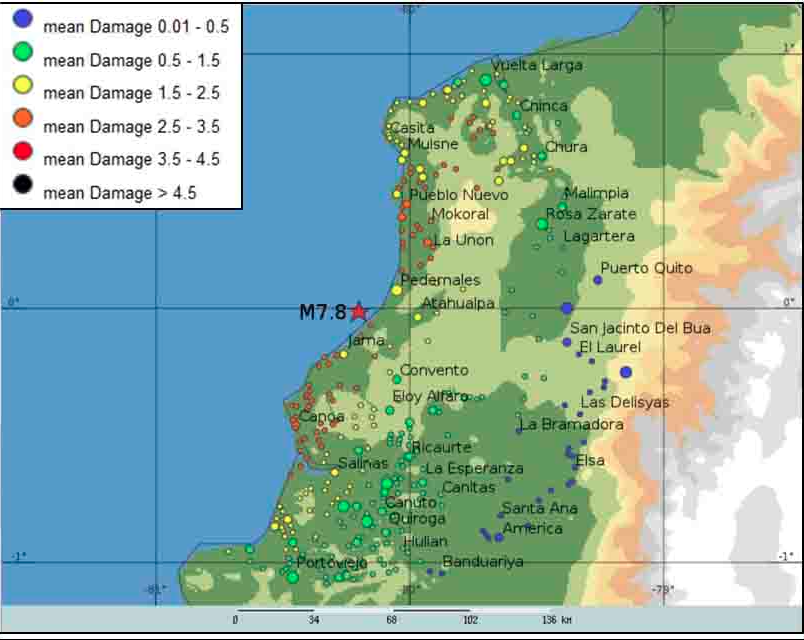

In [ ]:
#train[((train['month'] >= 4)&(train['month'] <= 6)&(train['year']==2016))].groupby(['family','year','month'])['sales'].mean().loc[12].plot()

In [ ]:
rcParams['figure.figsize'] = 20, 7
temp = train.groupby(['family','year','month'])['sales'].mean()#.loc[12].plot()
temp.loc[12].plot(label=family_dict[12])
plt.legend()
#for num,name in family_dict.items():
#    temp.loc[num].plot(label=f'{num,name}')
#    plt.legend()
#    plt.show()
plt.show()
oil.groupby(['year','month'])['interp'].mean().plot()
plt.show()

In [ ]:
train